## Pose Detection with OpenPose
Используем библиотеку OpenPose для детектирования поз рук водителя во время езды.


## Install OpenPose

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local

  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt

  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  !pip install -q youtube-dl
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`
  
from IPython.display import YouTubeVideo

Selecting previously unselected package libgflags2.2.
(Reading database ... 145480 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.3.5-1) ...
Selecting previously unselected package libhdf5-serial-dev.
Preparing to unpack .../04-libhdf5-serial-dev_1.10.0-patch1+docs-4_all.deb ...
Unpacking libhdf5-serial-dev (1.10.0-patch1+docs-4) ...
Selecting previously unselected package libleveldb1v5:amd64.
Preparing to unpack ...

## Detect poses on a test video

Будем тестировать детектирование на видео из ютуба.

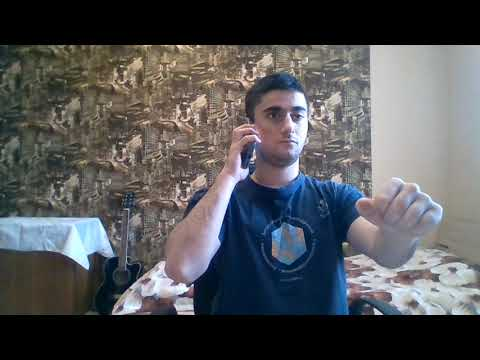

In [ ]:
from IPython.display import YouTubeVideo

# YOUTUBE_ID = 'NrJSbNadnkQ' #тестовое видео
# YOUTUBE_ID = '9pLIRbDuep8' #углы сгиба локтя с телефоном
# YOUTUBE_ID = 'znBTIQO7PUs'  #углы сгиба локтя когда руки на руле 
# YOUTUBE_ID = 'Igibbus4PWc'  #demo2
# YOUTUBE_ID = 'YxykjSXN0MU'  #demo3
YOUTUBE_ID = 'AWFCfnSXJs4'  #demo4



YouTubeVideo(YOUTUBE_ID)

In [ ]:
#скачаем видео
!rm -rf youtube.mp4
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID

# Вырежем нужную часть из видео
!ffmpeg -y -loglevel info -i youtube.mp4 -ss 00:00:05 -t 29 -r 25 video.mp4

# детектируем позы
!rm openpose.avi
!cd openpose && rm -rf output/
!cd openpose && ./build/examples/openpose/openpose.bin --video ../video.mp4 --face --hand --write_json ./output/ --display 0  --write_video ../openpose.avi
# обернем результат в новое видео .mp4
!ffmpeg -y -loglevel info -i openpose.avi output.mp4

[youtube] AWFCfnSXJs4: Downloading webpage
[youtube] AWFCfnSXJs4: Downloading MPD manifest
[dashsegments] Total fragments: 8
[download] Destination: youtube.mp4
[download] 100% of 9.80MiB in 00:00
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-li

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

## Напишем необходимые функции для получения фичей


Взглянем на результат:

In [ ]:
import json
import pandas as pd
import numpy as np
from math import acos, degrees
import seaborn as sns
import cv2
import os
import re
from PIL import Image, ImageDraw, ImageFont

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
!pip install soundfile

In [ ]:
import soundfile as sf
from tqdm import tqdm_notebook

In [ ]:
"""#получим список файлов с кейпоинтами на каждом кадре видео
files = os.listdir(path='openpose/output/')
#print(len(os.listdir(path='openpose/output/')))
files.sort()

#получим списки с кейпонтами каждой руки на каждом кадре, с такими списками легче будет в дальнейщем обрабатывать и анализировать данные
hand_left_keypoints = []
hand_right_keypoints = []
for i in range(len(os.listdir(path='openpose/output/'))):
  with open(f"openpose/output/{files[i]}", 'r') as read_file:
    data = json.load(read_file)
    #print(data)
    #print(data["people"][0]["hand_left_keypoints_2d"])
    hand_left_keypoints.append(data["people"][0]["hand_left_keypoints_2d"])
    hand_right_keypoints.append(data["people"][0]["hand_right_keypoints_2d"])

for i in hand_left_keypoints: 
  print(i)

print(len(hand_left_keypoints))
print(len(hand_right_keypoints))
"""

'#получим список файлов с кейпоинтами на каждом кадре видео\nfiles = os.listdir(path=\'openpose/output/\')\n#print(len(os.listdir(path=\'openpose/output/\')))\nfiles.sort()\n\n#получим списки с кейпонтами каждой руки на каждом кадре, с такими списками легче будет в дальнейщем обрабатывать и анализировать данные\nhand_left_keypoints = []\nhand_right_keypoints = []\nfor i in range(len(os.listdir(path=\'openpose/output/\'))):\n  with open(f"openpose/output/{files[i]}", \'r\') as read_file:\n    data = json.load(read_file)\n    #print(data)\n    #print(data["people"][0]["hand_left_keypoints_2d"])\n    hand_left_keypoints.append(data["people"][0]["hand_left_keypoints_2d"])\n    hand_right_keypoints.append(data["people"][0]["hand_right_keypoints_2d"])\n\nfor i in hand_left_keypoints: \n  print(i)\n\nprint(len(hand_left_keypoints))\nprint(len(hand_right_keypoints))\n'

In [ ]:
#посмотрим на то, как выглядят JSON файлы, которые выдает openpose
!cd openpose/output/ && cat video_000000000001_keypoints.json | python -m json.tool

{
    "version": 1.3,
    "people": [
        {
            "person_id": [
                -1
            ],
            "pose_keypoints_2d": [
                754.781,
                233.672,
                0.783409,
                731.268,
                413.907,
                0.696453,
                574.512,
                413.869,
                0.478379,
                541.28,
                627.408,
                0.622455,
                648.953,
                566.655,
                0.54467,
                889.935,
                409.978,
                0.530453,
                1042.76,
                601.998,
                0.470453,
                1074.1,
                541.254,
                0.282923,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
    

In [ ]:
#находим интересующего нас человека на кадре
def find_center_person(json_file, width, height):
    x_center = width / 2
    y_center = height / 2
    people_center = []
    
    for people in json_file['people']:
        people_center_x = np.mean(list(filter(lambda x: x != 0, people['pose_keypoints_2d'][::3])))
        people_center_y = np.mean(list(filter(lambda x: x != 0, people['pose_keypoints_2d'][1::3])))
        dist_from_center_x = abs(people_center_x - x_center)
        dist_from_center_y = abs(people_center_x - x_center)
        dist_from_center = (dist_from_center_x**2+dist_from_center_y**2)**0.5
        people_center.append(dist_from_center)
    if len(people_center)>0:
        center_person = np.argmin(people_center)
    else:
        center_person = None
    return center_person

In [ ]:
def dist_two(keypoint_df, fist_ind, last_ind):
    return ((keypoint_df[::3][last_ind]-keypoint_df[::3][fist_ind])**2+(keypoint_df[1::3][last_ind]-keypoint_df[1::3][fist_ind])**2)**0.5

In [ ]:
def get_angle(keypoint_df, a_ind, b_ind, c_ind):
    a = dist_two(keypoint_df, a_ind,b_ind)
    b = dist_two(keypoint_df, b_ind,c_ind)
    c = dist_two(keypoint_df, a_ind,c_ind)
    if ((a*b*c)!=0):
        angle = degrees(acos((a**2+b**2-c**2)/(2*a*b)))
    else:
        angle = None
    return angle

In [ ]:
def make_features(json_file, central_person_ind):
    keypoints = json_file['people'][central_person_ind]['pose_keypoints_2d']
    rshoulder_x = keypoints[::3][2]
    rshoulder_y = keypoints[1::3][2]
    relbow_x = keypoints[::3][3]
    relbow_y = keypoints[1::3][3]
    rwrist_x = keypoints[::3][4]
    rwrist_y = keypoints[1::3][4]
    lshoulder_x = keypoints[::3][5]
    lshoulder_y = keypoints[1::3][5]
    lelbow_x = keypoints[::3][6]
    lelbow_y = keypoints[1::3][6]
    lwrist_x = keypoints[::3][7]
    lwrist_y = keypoints[1::3][7]

    r_l_shoulder_dist = abs(rshoulder_x - lshoulder_x)
    r_l_elbow_dist = abs(relbow_x - lelbow_x)
    elbow_wrist_dist = abs(rshoulder_y - rwrist_y) + abs(lshoulder_y - lwrist_y)

    center_rect_x = json_file['people'][central_person_ind]['pose_keypoints_2d'][::3]
    center_rect_min_x = int(np.min(list(filter(lambda x: x != 0, center_rect_x))))
    center_rect_y = json_file['people'][central_person_ind]['pose_keypoints_2d'][1::3]
    center_rect_min_y = int(np.min(list(filter(lambda x: x != 0, center_rect_y))))
    center_rect_max_x = int(np.max(json_file['people'][central_person_ind]['pose_keypoints_2d'][::3]))
    center_rect_max_y = int(np.max(json_file['people'][central_person_ind]['pose_keypoints_2d'][1::3]))
    
    right_el_angle = get_angle(keypoints, 4,3,2)  
    left_el_angle = get_angle(keypoints, 7,6,5)
    
    right_sh_angle = get_angle(keypoints, 3,2,5)   
    left_sh_angle = get_angle(keypoints, 6,5,2)
    
    rwrist_conf = keypoints[2::3][4]
    lwrist_conf = keypoints[2::3][7]
    
    return center_rect_min_x,center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf

 ## Посмотрим на углы сгиба локтей при плохом положении руки

In [ ]:
bad_el_sh_sh = []
bad_el_wr_sh_sh = []
bad_right_el_angle = []

#получим список файлов с кейпоинтами на каждом кадре видео
files = os.listdir(path='openpose/output/')
#print(len(os.listdir(path='openpose/output/')))
files.sort()

data = json.load(open(f"openpose/output/{files[0]}"))


for i in range(len(os.listdir(path='openpose/output/'))):
    data = json.load(open(f"openpose/output/{files[i]}"))
    center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf = make_features(data, 0)
    
    if (r_l_shoulder_dist!=0) and (r_l_elbow_dist!=0) and (right_sh_angle is not None) and (left_sh_angle is not None) and (right_el_angle is not None) and (left_el_angle is not None):
      el_sh_sh = r_l_elbow_dist / r_l_shoulder_dist
      el_wr_sh_sh = elbow_wrist_dist / r_l_shoulder_dist
      bad_el_sh_sh.append(el_sh_sh)
      bad_el_wr_sh_sh.append(el_wr_sh_sh)

    if (right_el_angle != 0) and (right_el_angle is not None):
      bad_right_el_angle.append(right_el_angle)



/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


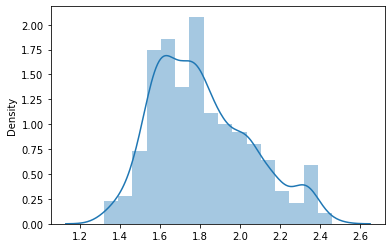

In [ ]:
sns.distplot(bad_el_sh_sh)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


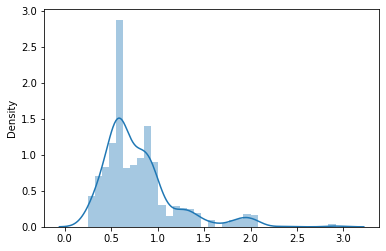

In [ ]:
sns.distplot(bad_el_wr_sh_sh)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


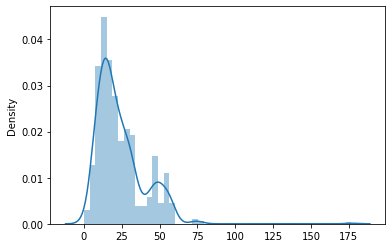

In [ ]:
sns.distplot(bad_right_el_angle)

In [ ]:
print(np.mean(bad_right_el_angle))


23.86794768463977


In [ ]:
print((np.mean(bad_right_el_angle) + np.min(bad_right_el_angle)) / 2)

11.94589341891322


In [ ]:
u, c = np.unique(bad_right_el_angle, return_counts=True)
u[c.argmax()]

7.820319461739941

## Посмотрим на угол сгиба локтя когда руки почти всегда на руле

In [ ]:
norm_el_sh_sh = []
norm_el_wr_sh_sh = []
norm_right_el_angle = []

#получим список файлов с кейпоинтами на каждом кадре видео
files = os.listdir(path='openpose/output/')
#print(len(os.listdir(path='openpose/output/')))
files.sort()

data = json.load(open(f"openpose/output/{files[0]}"))


for i in range(len(os.listdir(path='openpose/output/'))):
    data = json.load(open(f"openpose/output/{files[i]}"))
    center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf = make_features(data, 0)
    
    if (r_l_shoulder_dist!=0) and (r_l_elbow_dist!=0) and (right_sh_angle is not None) and (left_sh_angle is not None) and (right_el_angle is not None) and (left_el_angle is not None):
      el_sh_sh = r_l_elbow_dist / r_l_shoulder_dist
      el_wr_sh_sh = elbow_wrist_dist / r_l_shoulder_dist
      norm_el_sh_sh.append(el_sh_sh)
      norm_el_wr_sh_sh.append(el_wr_sh_sh)

    if (right_el_angle != 0) and (right_el_angle is not None):
      norm_right_el_angle.append(right_el_angle)



/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


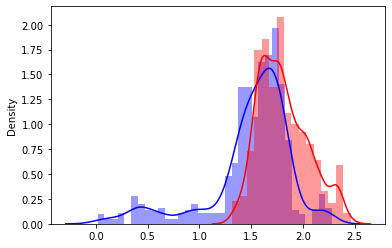

In [ ]:
sns.distplot(norm_el_sh_sh, color='b')
sns.distplot(bad_el_sh_sh, color='r')

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


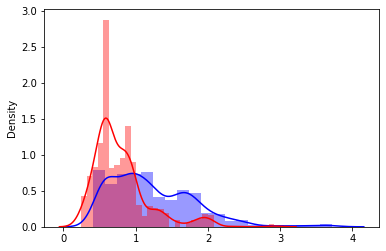

In [ ]:
sns.distplot(norm_el_wr_sh_sh, color='b')
sns.distplot(bad_el_wr_sh_sh, color='r')

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


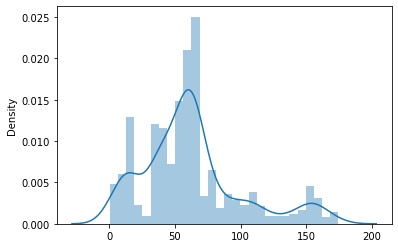

In [ ]:
sns.distplot(norm_right_el_angle)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


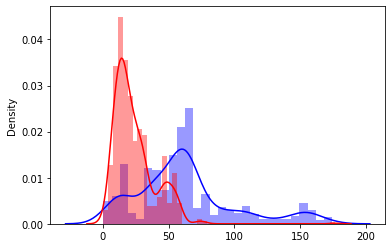

In [ ]:
sns.distplot(norm_right_el_angle, color='b')
sns.distplot(bad_right_el_angle, color='r')

In [ ]:
print(np.max(norm_right_el_angle))
print(np.mean(norm_right_el_angle))

174.4951647143115
62.317924567371655


In [ ]:
print(np.mean(bad_right_el_angle))

23.86794768463977


## Рисуем на видео с помощью OpenCV

In [ ]:
def draw_alert(img_path, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=None):
    # cv_img = np.array(Image.open(img_path))
    cv_img = cv2.imread(img_path)

    start_point = (0, 10)
    end_point = (1920, 100)
    color = (0, 0, 255)

    cv2.rectangle(cv_img, start_point, end_point, color, cv2.FILLED)
    cv2.rectangle(cv_img,(center_rect_min_x, center_rect_min_y),(center_rect_max_x,center_rect_max_y ), color, 10)

    font = cv2.FONT_ITALIC
    cv2.putText(cv_img, 'Attention!', (600, 70), font, 1, (255,255,255), 2)

    if param_list is not None:
        t=0
        for p in param_list:
            if p is not None:
                s = str(round(p,2))
            else:
                s = str(p)
            cv2.putText(cv_img, s, (100, 40+t), font, 0.5, (255,255,255), 2)
            t+=20
    
    # alert_frame = Image.fromarray(cv_img, 'RGB')
    return cv_img

In [ ]:
def draw_img(img_path, param_list=None):
    fig1 = plt.figure(figsize = (20,20))
    img_2 = cv2.imread(img_path)
    b,g,r = cv2.split(img_2)           # get b, g, r
    rgb_img1 = cv2.merge([r,g,b]) 
    plt.imshow(rgb_img1)
    plt.show()

In [ ]:
def make_alert_img(img_path, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=None):
    alert_frame_array = draw_alert(img_path, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=param_list)
    # cv_alert_frame = np.array(alert_frame)

    # img_array = np.array(Image.open(img_path))
    img_array = cv2.imread(img_path)
    alpha = 0.6

    frame_overlay=cv2.addWeighted(alert_frame_array, alpha, img_array, 1-alpha, gamma=0)
    # frame_overlay = Image.fromarray(frame_overlay, 'RGB')

    return frame_overlay

In [ ]:
def make_img(img_path, param_list=None):
    # img = Image.open(img_path)
    # img = np.array(img)

    img = cv2.imread(img_path)

    font = cv2.FONT_ITALIC
    if param_list is not None:
        t=0
        for p in param_list:
            if p is not None:
                s = str(round(p,2))
            else:
                s = str(p)
            cv2.putText(img, s, (100, 40+t), font, 0.5, (255,255,255), 2)
            t+=20
            
    return img

## Создаем звук алерта


In [ ]:
def make_beep_sound():
    frequency = 700  # Our played note will be 700 Hz
    fs = 44100  # 44100 samples per second
    seconds = 1/25  # Note duration of 1/25 seconds

    # Generate array with seconds*sample_rate steps, ranging between 0 and seconds
    t = np.linspace(0, seconds, int(seconds * fs), False)

    # Generate a 440 Hz sine wave
    note = np.sin(frequency * t * 2 * np.pi)

    # Ensure that highest value is in 16-bit range
    audio = note * (2**15 - 1) / np.max(np.abs(note))
    # Convert to 16-bit data
    beep_array = audio.astype(np.int16)
    return beep_array

In [ ]:
def make_silent_sound():
    fs = 44100  # 44100 samples per second
    seconds = 1/25  # Note duration of 1/25 seconds
    silent_array = np.array([0]*round(seconds * fs))
    silent_array = silent_array.astype(np.int16)
    return silent_array

In [ ]:
make_silent_sound()

array([0, 0, 0, ..., 0, 0, 0], dtype=int16)

In [ ]:
make_beep_sound()

array([    0,  3263,  6494, ..., -9661, -6494, -3263], dtype=int16)

## Анализ работы функции наложения алерта на кадр

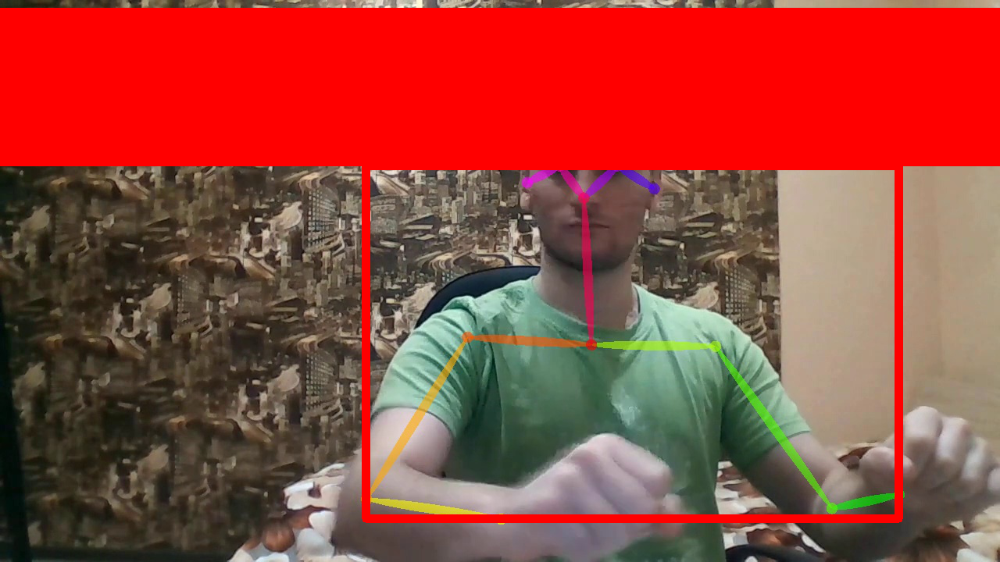

In [ ]:
files = os.listdir(path='openpose/output/')
files.sort()

data = json.load(open(f"openpose/output/{files[100]}"))
center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf = make_features(data, 0)

start_point = (0, 10)
end_point = (1920, center_rect_min_y)
color = (255, 0, 0)

img_path = './video_frames/frame100.jpg'

# img = Image.new('RGB', (800, 900), color= (171, 183, 255))
img = Image.open(img_path)
open_cv_image = np.array(img)
# open_cv_image = np.array('./video_frames/frame100.jpg') 
cv2.rectangle(open_cv_image, start_point, end_point, color, cv2.FILLED)
cv2.rectangle(open_cv_image,(center_rect_min_x, center_rect_min_y),(center_rect_max_x,center_rect_max_y ), color, 10)
img2 = Image.fromarray(open_cv_image, 'RGB')
img2

In [ ]:
img = Image.open('./video_frames/frame100.jpg')
open_cv_img = np.array(img)
draw_alert(open_cv_img, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y)
img = Image.fromarray(open_cv_img)

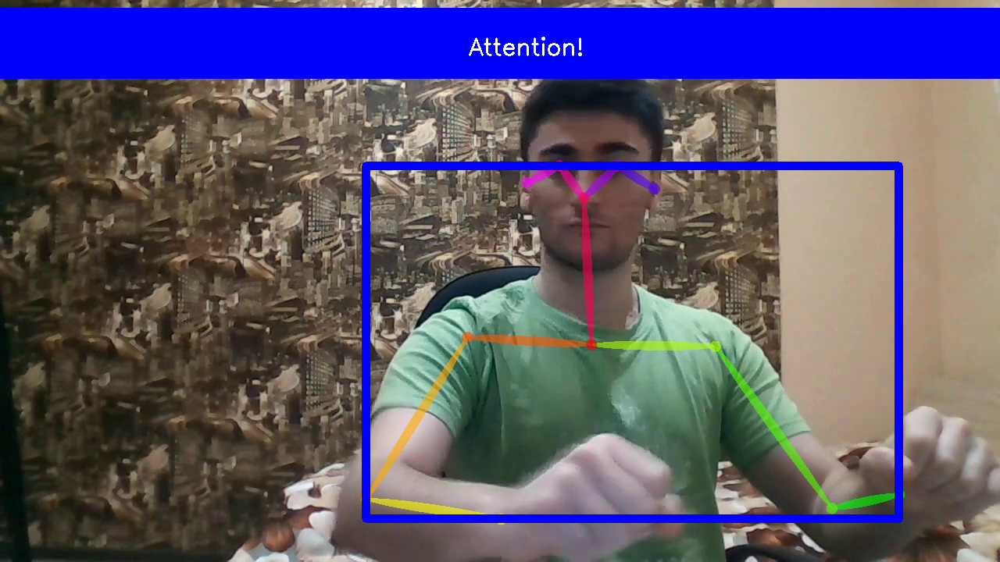

In [ ]:
img

In [ ]:
img.save('./alert_final.png')

In [ ]:
img_orig = Image.open('./video_frames/frame100.jpg')
array_img_orig = np.array(img_orig)
alpha = 0.6

frame_overlay_open_cv=cv2.addWeighted(open_cv_image, alpha, array_img_orig, 1-alpha, gamma=0)
frame_overlay = Image.fromarray(frame_overlay_open_cv)

In [ ]:

draw_alert_img('./video_frames/frame100.jpg', './alert_final.png', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y)

In [ ]:
make_alert_img('./video_frames/frame100.jpg', './alert_final.png', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y)

In [ ]:
def draw_alert(img, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=None):
    start_point = (0, 10)
    end_point = (1920, 100)
    color = (255, 0, 0)

    cv2.rectangle(img, start_point, end_point, color, cv2.FILLED)
    cv2.rectangle(img,(center_rect_min_x, center_rect_min_y),(center_rect_max_x,center_rect_max_y ), color, 10)

    font = cv2.FONT_ITALIC
    cv2.putText(img, 'Attention!', (600, 70), font, 1, (255,255,255), 2)

    if param_list is not None:
        t=0
        for p in param_list:
            if p is not None:
                s = str(round(p,2))
            else:
                s = str(p)
            cv2.putText(img, s, (100, 40+t), font, 0.5, (255,255,255), 2)
            t+=20
    
    return img

In [ ]:
def make_alert_img(img_path, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=None):
    img = cv2.imread(img_path)
    alert_img = cv2.imread(img_path)

    draw_alert(alert_img, center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, param_list=param_list)

    alpha = 0.6

    frame_overlay=cv2.addWeighted(alert_img, alpha, img, 1-alpha, gamma=0)
    frame_overlay = Image.fromarray(frame_overlay)

    return frame_overlay

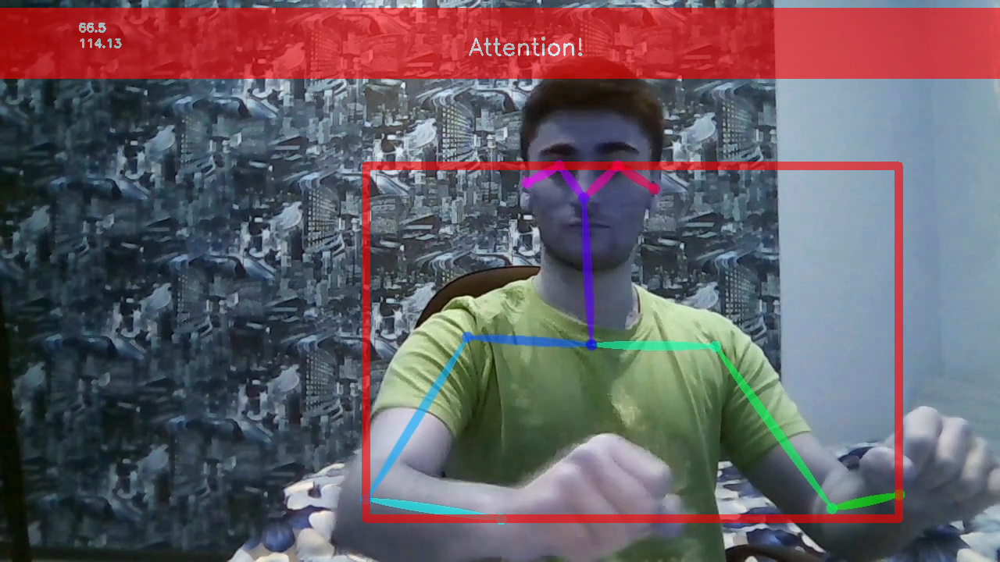

In [ ]:
make_alert_img('./video_frames/frame100.jpg', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, [right_el_angle, left_el_angle])

In [ ]:
def make_img(img_path, param_list=None):
    #fig1 = plt.figure(figsize = (20,20))
    img = Image.open(img_path)
    img = np.array(img)
    #b,g,r = cv2.split(img_2)           # get b, g, r
    #rgb_img1 = cv2.merge([r,g,b])
    font = cv2.FONT_ITALIC
    if param_list is not None:
        t=0
        for p in param_list:
            if p is not None:
                s = str(round(p,2))
            else:
                s = str(p)
            cv2.putText(img, s, (100, 40+t), font, 0.5, (255,255,255), 2)
            t+=20
    return img

In [ ]:
make_img('./video_frames/frame150.jpg')

array([[[ 57,  40,  20],
        [ 57,  42,  21],
        [ 56,  41,  20],
        ...,
        [191, 179, 155],
        [189, 177, 155],
        [188, 175, 156]],

       [[ 57,  42,  21],
        [ 57,  42,  21],
        [ 54,  42,  20],
        ...,
        [190, 178, 152],
        [188, 176, 154],
        [188, 176, 154]],

       [[ 57,  42,  21],
        [ 55,  43,  21],
        [ 54,  42,  20],
        ...,
        [190, 178, 152],
        [188, 176, 152],
        [188, 176, 152]],

       ...,

       [[ 38,  45,  37],
        [ 40,  45,  38],
        [ 38,  43,  36],
        ...,
        [ 91,  74,  66],
        [ 75,  60,  53],
        [ 76,  61,  54]],

       [[ 42,  49,  41],
        [ 44,  49,  42],
        [ 43,  48,  41],
        ...,
        [101,  87,  78],
        [ 87,  72,  65],
        [ 79,  64,  57]],

       [[ 40,  47,  39],
        [ 43,  48,  41],
        [ 43,  48,  41],
        ...,
        [104,  90,  81],
        [ 96,  81,  74],
        [ 90,  75,  68]]

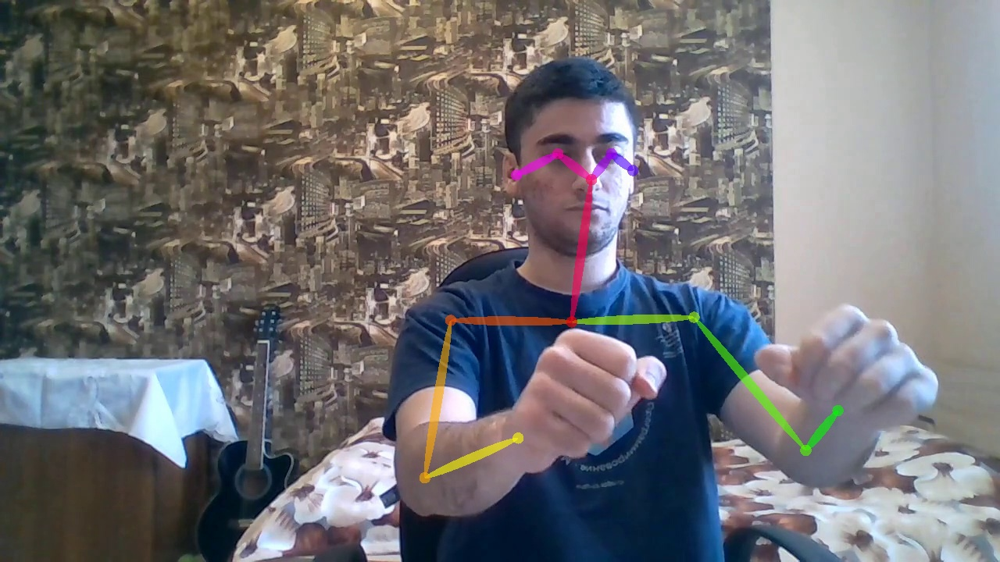

In [ ]:
b, g, r = cv2.split(make_img('./video_frames/frame10.jpg'))
rgb_img = cv2.merge([r,g,b])
Image.fromarray(rgb_img)

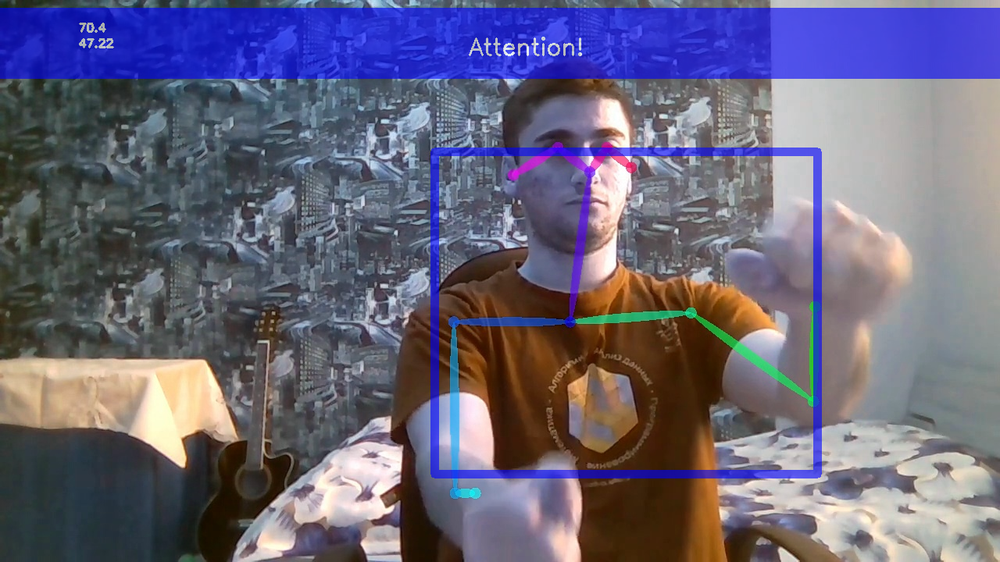

In [ ]:
Image.fromarray(make_alert_img('./video_frames/frame100.jpg', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, [right_el_angle, left_el_angle]))

## Тест функций для наложения алерта

In [ ]:
files = os.listdir(path='openpose/output/')
files.sort()

data = json.load(open(f"openpose/output/{files[10]}"))
center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf = make_features(data, 0)

img_path = './video_frames/frame10.jpg'

In [ ]:
make_alert_img('./video_frames/frame10.jpg', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, [right_el_angle, left_el_angle])

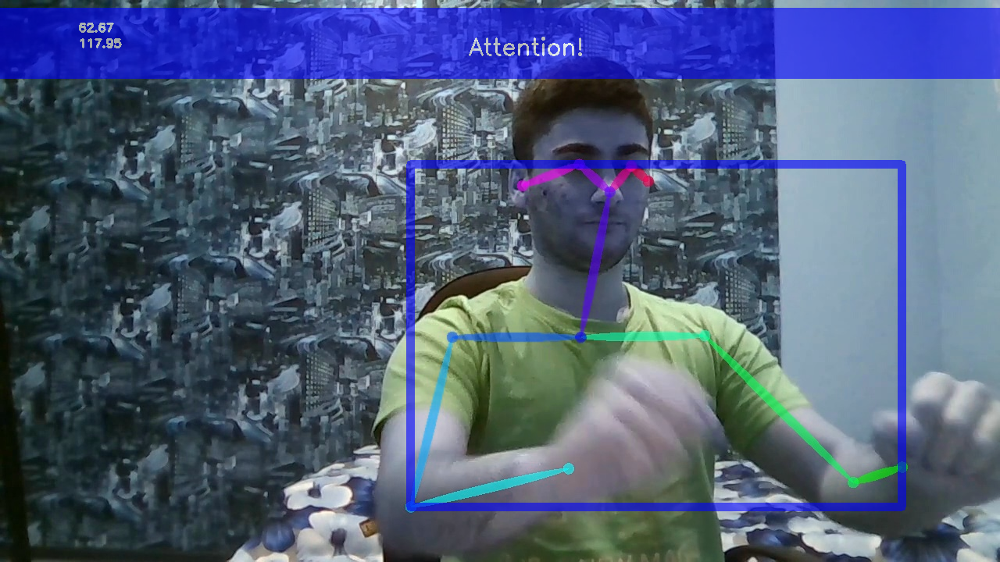

In [ ]:
Image.fromarray(make_alert_img('./video_frames/frame10.jpg', center_rect_min_x, center_rect_min_y, center_rect_max_x, center_rect_max_y, [right_el_angle, left_el_angle]))

In [ ]:
make_img('./video_frames/frame10.jpg', [right_el_angle, left_el_angle])

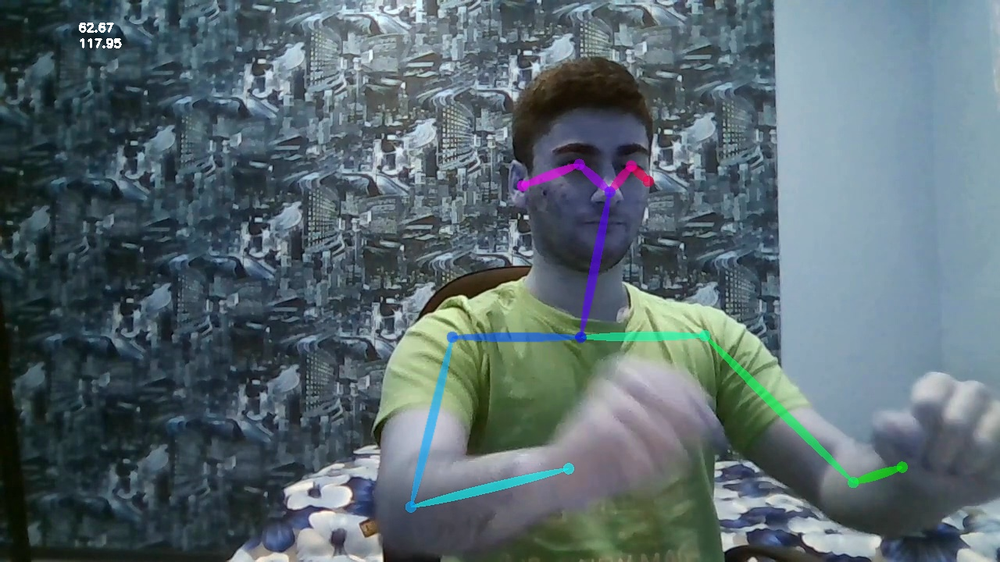

In [ ]:
Image.fromarray(make_img('./video_frames/frame10.jpg', [right_el_angle, left_el_angle]))

## Собираем видео и пути

In [ ]:
path_to_json = './openpose/output/'
outputs_video_path = './openpose.avi' #папка с видео с лэндмарками из openpose
frames_folder = 'video_frames' # папка с кадрами для кадров исходного видео для анализа
alert_output_video = 'test_video_alert.avi' # итоговое видео

In [ ]:
cap = cv2.VideoCapture(outputs_video_path)

In [ ]:
def get_vid_properties(): 
    width = int(cap.get(3))  # float
    height = int(cap.get(4)) # float

    return width,height

In [ ]:
print("Size:", get_vid_properties())

Size: (1280, 720)


In [ ]:
!rm -rf video_frames/
!mkdir -p video_frames

In [ ]:
current_frame = 0
while(1):
    ret, frame = cap.read()
    if ret:
        name = frames_folder + '/frame' + str(current_frame) + '.jpg'
        print("Creating frame:", name)

        cv2.imwrite(name, frame)

        current_frame += 1

    else:
        break


Creating frame: video_frames/frame0.jpg
Creating frame: video_frames/frame1.jpg
Creating frame: video_frames/frame2.jpg
Creating frame: video_frames/frame3.jpg
Creating frame: video_frames/frame4.jpg
Creating frame: video_frames/frame5.jpg
Creating frame: video_frames/frame6.jpg
Creating frame: video_frames/frame7.jpg
Creating frame: video_frames/frame8.jpg
Creating frame: video_frames/frame9.jpg
Creating frame: video_frames/frame10.jpg
Creating frame: video_frames/frame11.jpg
Creating frame: video_frames/frame12.jpg
Creating frame: video_frames/frame13.jpg
Creating frame: video_frames/frame14.jpg
Creating frame: video_frames/frame15.jpg
Creating frame: video_frames/frame16.jpg
Creating frame: video_frames/frame17.jpg
Creating frame: video_frames/frame18.jpg
Creating frame: video_frames/frame19.jpg
Creating frame: video_frames/frame20.jpg
Creating frame: video_frames/frame21.jpg
Creating frame: video_frames/frame22.jpg
Creating frame: video_frames/frame23.jpg
Creating frame: video_fram

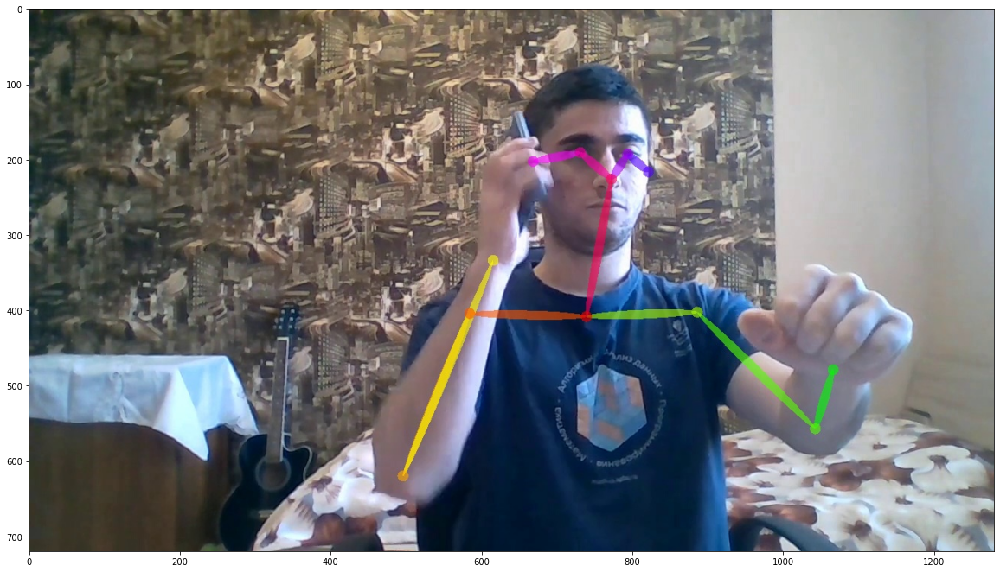

In [ ]:
draw_img('./video_frames/frame200.jpg')

In [ ]:
frames_folder = './'+frames_folder+'/'
frames_folder

'./video_frames/'

In [ ]:
# print(widht)

## Записываем видео

In [ ]:
!rm demo_audio.wav test_video_alert.avi demo_output_with_audio.mp4

rm: cannot remove 'demo_audio.wav': No such file or directory
rm: cannot remove 'test_video_alert.avi': No such file or directory
rm: cannot remove 'demo_output_with_audio.mp4': No such file or directory


In [ ]:
widht, height = get_vid_properties()
out = cv2.VideoWriter(alert_output_video, cv2.VideoWriter_fourcc('M','J','P','G'), 25, (widht,height))

In [ ]:
audio_list = []
alert_list = []
alert_5frames = [0]*50

norm_1 = []
bad_1 = []
norm_2 = []
bad_2 = []

for ind, frame in tqdm_notebook(enumerate(sorted(os.listdir(frames_folder), key=lambda x: (int(re.sub('\D','',x)),x)))):
    # print('ok')
    frame_path = frames_folder+str(frame)
    json_out = (sorted(os.listdir(path_to_json), key=lambda x: (int(re.sub('\D','',x)),x)))[ind]
    json_path = path_to_json+str(json_out)
    temp_df = json.load(open(json_path))
    central_person_ind = find_center_person(temp_df, widht, height)

    if central_person_ind is not None:
        center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, r_l_shoulder_dist, r_l_elbow_dist, elbow_wrist_dist, right_el_angle, left_el_angle, right_sh_angle, left_sh_angle, rwrist_conf, lwrist_conf = make_features(temp_df, central_person_ind)

        if (r_l_shoulder_dist!=0) and (r_l_elbow_dist!=0) and (right_sh_angle is not None) and (left_sh_angle is not None) and (right_el_angle is not None) and (left_el_angle is not None):
            norm_1.append(right_el_angle)
            norm_2.append(left_el_angle)

            if (((right_el_angle < 23) or (left_el_angle < 23)) and (rwrist_conf > 0.3 and lwrist_conf > 0.3)):
                alert_5frames=alert_5frames[1:]
                alert_5frames.append(1)
                alert_list.append(frame)
                print('ALERT', json_path)

                bad_1.append(right_el_angle)
                bad_2.append(left_el_angle)

                if sum(alert_5frames)>1:
                    alert_frame = make_alert_img(frame_path, center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                    out.write(alert_frame)
                    audio_list.extend(make_beep_sound())
                else:
                    norm_frame = make_img(frame_path, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                    out.write(norm_frame)
                    audio_list.extend(make_silent_sound())
            else:
                alert_5frames=alert_5frames[1:]
                alert_5frames.append(0)
                alert_list.append(frame)

                if sum(alert_5frames)>3:
                    alert_frame = make_alert_img(frame_path, center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                    out.write(alert_frame)
                    audio_list.extend(make_beep_sound())
                else:
                    norm_frame = make_img(frame_path, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                    out.write(norm_frame)
                    audio_list.extend(make_silent_sound())
        else:
            alert_5frames=alert_5frames[1:]
            alert_5frames.append(0)

            if sum(alert_5frames)>3:
                alert_frame = make_alert_img(frame_path, center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                out.write(alert_frame)
                audio_list.extend(make_beep_sound())
            else:
                norm_frame = make_img(frame_path, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
                out.write(norm_frame)
                audio_list.extend(make_silent_sound())
    else:
        if sum(alert_5frames)>3:
            alert_frame = make_alert_img(frame_path, center_rect_min_x, center_rect_min_y, center_rect_max_x,center_rect_max_y, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
            out.write(alert_frame)
            audio_list.extend(make_beep_sound())
        else:
            norm_frame = make_img(frame_path, [right_el_angle, left_el_angle, rwrist_conf, lwrist_conf])
            out.write(norm_frame)
            audio_list.extend(make_silent_sound())

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # Remove the CWD from sys.path while we load stuff.


ALERT ./openpose/output/video_000000000193_keypoints.json
ALERT ./openpose/output/video_000000000194_keypoints.json
ALERT ./openpose/output/video_000000000195_keypoints.json
ALERT ./openpose/output/video_000000000196_keypoints.json
ALERT ./openpose/output/video_000000000197_keypoints.json
ALERT ./openpose/output/video_000000000198_keypoints.json
ALERT ./openpose/output/video_000000000199_keypoints.json
ALERT ./openpose/output/video_000000000200_keypoints.json
ALERT ./openpose/output/video_000000000201_keypoints.json
ALERT ./openpose/output/video_000000000202_keypoints.json
ALERT ./openpose/output/video_000000000203_keypoints.json
ALERT ./openpose/output/video_000000000204_keypoints.json
ALERT ./openpose/output/video_000000000205_keypoints.json
ALERT ./openpose/output/video_000000000206_keypoints.json
ALERT ./openpose/output/video_000000000207_keypoints.json
ALERT ./openpose/output/video_000000000208_keypoints.json
ALERT ./openpose/output/video_000000000209_keypoints.json
ALERT ./openpo

In [ ]:
out.release()

In [ ]:
sf.write('demo_audio.wav', audio_list, 44100)

In [ ]:
!ffmpeg -i test_video_alert.avi -i demo_audio.wav -c:v copy -c:a aac demo_output_with_audio.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib